In [1]:
import os
from glob import glob
import numpy as np
import dask
import xarray as xr
import cartopy.crs as ccrs
from cmocean import cm
import xgcm
import xscale as xsc

from matplotlib import pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = 20, 12

from mitequinox.utils import *
from dask import compute, delayed

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/cmocean/tools.py:76: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not mpl.cbook.is_string_like(rgbin[0]):
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


In [2]:
from dask_jobqueue import PBSCluster
local_dir = os.getenv('TMPDIR')
cluster = PBSCluster(local_directory=local_dir)
#print(cluster.job_script())
w = cluster.start_workers(10)

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/utils.py:128: RuntimeWarning: Couldn't detect a suitable IP address for reaching '8.8.8.8', defaulting to '127.0.0.1': [Errno 101] Network is unreachable
  % (host, default, e), RuntimeWarning)


In [3]:
# get dask handles and check dask server status
from dask.distributed import Client
client = Client(cluster)

In [1]:
client

NameError: name 'client' is not defined

_________
# 1. Read dataset


In [5]:
u = 'SSU'
v = 'SSV'
## open files, nc files
ncdata_dir = '/home1/scratch/xyu/mit_nc_t/'
E_dir = '/home1/scratch/xyu/mit_nc_t/'

In [6]:
face = 5

filenames = sorted(glob(ncdata_dir+u+'_f%02d_t*.nc' %(face)))
print('Number of files available: %d' %len(filenames))
ds_u = xr.open_mfdataset(filenames, chunks={'i_g':432, 'j':432}, concat_dim='time', compat='equals')

print(ds_u)

Number of files available: 1
<xarray.Dataset>
Dimensions:  (i_g: 4320, j: 4320, time: 720)
Coordinates:
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
    face     int64 5
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 5.717e+06 ...
    dtime    (time) datetime64[ns] dask.array<shape=(720,), chunksize=(720,)>
Data variables:
    SSU      (i_g, j, time) float32 dask.array<shape=(4320, 4320, 720), chunksize=(432, 432, 720)>


In [7]:
face = 5

filenames = sorted(glob(ncdata_dir+v+'_f%02d_t*.nc' %(face)))
print('Number of files available: %d' %len(filenames))
ds_v = xr.open_mfdataset(filenames, chunks={'i':432, 'j_g':432}, concat_dim='time', compat='equals')

print(ds_v)

Number of files available: 1
<xarray.Dataset>
Dimensions:  (i: 4320, j_g: 4320, time: 720)
Coordinates:
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    face     int64 5
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 5.717e+06 ...
    dtime    (time) datetime64[ns] dask.array<shape=(720,), chunksize=(720,)>
Data variables:
    SSV      (i, j_g, time) float32 dask.array<shape=(4320, 4320, 720), chunksize=(432, 432, 720)>


---
# 2. Filter

In [8]:
wt_u = ds_u['SSU'].window

cutoff = 1 # A 1.5-day cutoff
dx = 1./24. # Define the sampling period (one day)
wt_u.set(n=24*1, dim='time', cutoff=cutoff, dx=dx, window='boxcar')

ds_u_f = wt_u.convolve(trim=True)
print(ds_u_f)

<xarray.DataArray 'SSU' (i_g: 4320, j: 4320, time: 720)>
dask.array<shape=(4320, 4320, 720), dtype=float32, chunksize=(432, 432, 720)>
Coordinates:
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
    face     int64 5
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 5.717e+06 ...
    dtime    (time) datetime64[ns] dask.array<shape=(720,), chunksize=(720,)>


In [9]:
wt_v = ds_v['SSV'].window

cutoff = 1 # A 1-day cutoff
dx = 1./24. # Define the sampling period (one day)
wt_v.set(n=24*1, dim='time', cutoff=cutoff, dx=dx, window='boxcar')

ds_v_f = wt_v.convolve(trim=True)
print(ds_v_f)

<xarray.DataArray 'SSV' (i: 4320, j_g: 4320, time: 720)>
dask.array<shape=(4320, 4320, 720), dtype=float32, chunksize=(432, 432, 720)>
Coordinates:
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    face     int64 5
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 5.717e+06 ...
    dtime    (time) datetime64[ns] dask.array<shape=(720,), chunksize=(720,)>


In [10]:
it= 360

SSV = ds_v['SSV'].isel(time=it) # 432 file read, because of i chunks
SSV = SSV.persist()

SSU = ds_u['SSU'].isel(time=it) # 432 file read, because of i chunks
SSU = SSU.persist()

SSV_low = ds_v_f.isel(time=it) # 1836 file read
SSV_low = SSV_low.persist()

SSU_low = ds_u_f.isel(time=it) # 1836 file read
SSU_low = SSU_low.persist()

In [11]:
SSV = ds_v['SSV'].isel(time=it) # 432 file read, because of i chunks
SSV = np.real(SSV).rename('SSV') 
SSV = SSV.chunk({'i':432,'j_g':432})    
SSV.to_dataset().to_zarr(E_dir+'SSV.zarr', mode='w')

In [12]:
SSU = ds_u['SSU'].isel(time=it) # 432 file read, because of i chunks
SSU = np.real(SSU).rename('SSU') 
SSU = SSU.chunk({'i_g':432,'j':432})    
SSU.to_dataset().to_zarr(E_dir+'SSU.zarr', mode='w')

In [13]:
it = 360

SSV_low = ds_v_f.isel(time=it) # 1836 file read
SSV_low = np.real(SSV_low).rename('SSV_low') 
SSV_low = SSV_low.chunk({'i':432,'j_g':432})    
SSV_low.to_dataset().to_zarr(E_dir+'SSV_low.zarr', mode='w')

In [14]:
SSU_low = ds_u_f.isel(time=it) # 1836 file read
SSU_low = np.real(SSU_low).rename('SSU_low') 
SSU_low = SSU_low.chunk({'i_g':432,'j':432})    
SSU_low.to_dataset().to_zarr(E_dir+'SSU_low.zarr', mode='w')

Text(0.5,1,'low pass filtered SSV')

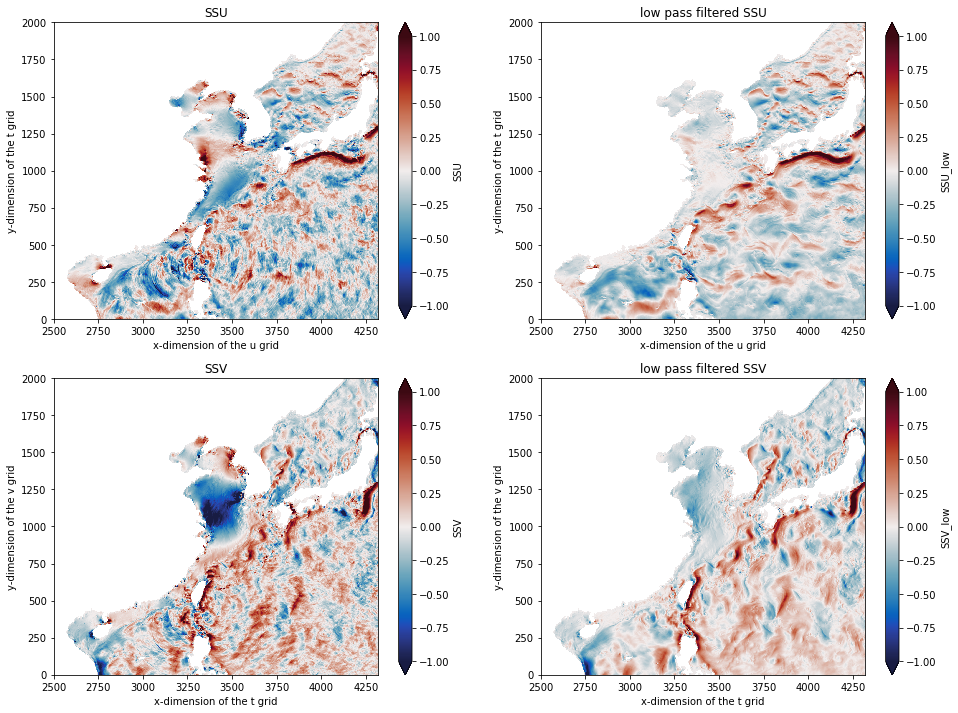

In [16]:
plt.figure(figsize=(16,12))

ax=plt.subplot(221)
SSU.isel(i_g=slice(2500,4320), j=slice(0,2000)).plot(ax=ax, x='i_g', y='j', vmin=-1, vmax=1, cmap = cm.balance)
ax.set_title('SSU')
#
ax=plt.subplot(222)
SSU_low.isel(i_g=slice(2500,4320), j=slice(0,2000)).plot(ax=ax, x='i_g', y='j', vmin=-1, vmax=1, cmap = cm.balance)
ax.set_title('low pass filtered SSU')


ax=plt.subplot(223)
SSV.isel(i=slice(2500,4320), j_g=slice(0,2000)).plot(ax=ax, x='i', y='j_g', vmin=-1, vmax=1, cmap = cm.balance)
ax.set_title('SSV')
#
ax=plt.subplot(224)
SSV_low.isel(i=slice(2500,4320), j_g=slice(0,2000)).plot(ax=ax, x='i', y='j_g', vmin=-1, vmax=1, cmap = cm.balance)
ax.set_title('low pass filtered SSV')

# 3. Parameters

## 3.1 Filtering

In [6]:
ds_SSU = xr.open_zarr(E_dir+'SSU_low.zarr')
ds_SSV = xr.open_zarr(E_dir+'SSV_low.zarr')

In [7]:
mgrid = xr.open_dataset(scratch+'/grid/mit_grid_t.nc')
grid = mgrid.isel(face=5)

In [8]:
ds = xr.merge([ds_SSU, ds_SSV, grid])
print(ds)

<xarray.Dataset>
Dimensions:  (i: 4320, i_g: 4320, j: 4320, j_g: 4320)
Coordinates:
    dtime    datetime64[ns] 2011-11-30
    face     int64 5
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
    time     float64 6.998e+06
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    XC       (i, j) float32 ...
    YC       (i, j) float32 ...
    XG       (i_g, j_g) float32 ...
    YG       (i_g, j_g) float32 ...
    CS       (i, j) float32 ...
    SN       (i, j) float32 ...
    rA       (i, j) float32 ...
    dxG      (i, j_g) float32 ...
    dyG      (j, i_g) float32 ...
    Depth    (i, j) float32 ...
    rAz      (i_g, j_g) float32 ...
    dxC      (j, i_g) float32 ...
    dyC      (i, j_g) float32 ...
    rAw      (j, i_g) float32 ...
    rAs      (i, j_g) float32 ...
Dat

In [9]:
grid = xgcm.Grid(ds, periodic=['X', 'Y'])
grid

<xgcm.Grid>
Y Axis (periodic):
  * center   j (4320) --> left
  * left     j_g (4320) --> center
X Axis (periodic):
  * center   i (4320) --> left
  * left     i_g (4320) --> center

In [10]:
zeta = (grid.diff(ds.dyC * ds['SSV_low'],'X') - grid.diff(ds.dxC * ds['SSU_low'],'Y'))/ds.rAz # relative vorticity  

In [11]:
lat = ds['YG']
omega = 7.3/100000
f = 2*omega*np.sin(np.deg2rad(lat))

In [12]:
print(f)

<xarray.DataArray 'YG' (i_g: 4320, j_g: 4320)>
array([[3.467117e-05, 3.471731e-05, 3.476344e-05, ..., 1.348841e-04,
        1.348851e-04, 1.348859e-04],
       [3.467117e-05, 3.471731e-05, 3.476344e-05, ..., 1.348842e-04,
        1.348852e-04, 1.348860e-04],
       [3.467117e-05, 3.471731e-05, 3.476344e-05, ..., 1.348844e-04,
        1.348855e-04, 1.348864e-04],
       ...,
       [3.467117e-05, 3.471731e-05, 3.476344e-05, ..., 1.348848e-04,
        1.348859e-04, 1.348869e-04],
       [3.467117e-05, 3.471731e-05, 3.476344e-05, ..., 1.348844e-04,
        1.348855e-04, 1.348864e-04],
       [3.467117e-05, 3.471731e-05, 3.476344e-05, ..., 1.348842e-04,
        1.348852e-04, 1.348860e-04]], dtype=float32)
Coordinates:
    dtime    datetime64[ns] 2011-11-30
    face     int64 5
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    time     float64 6.998e+06
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    XG       (i_g, j_g) flo

In [22]:
zeta = zeta.load()

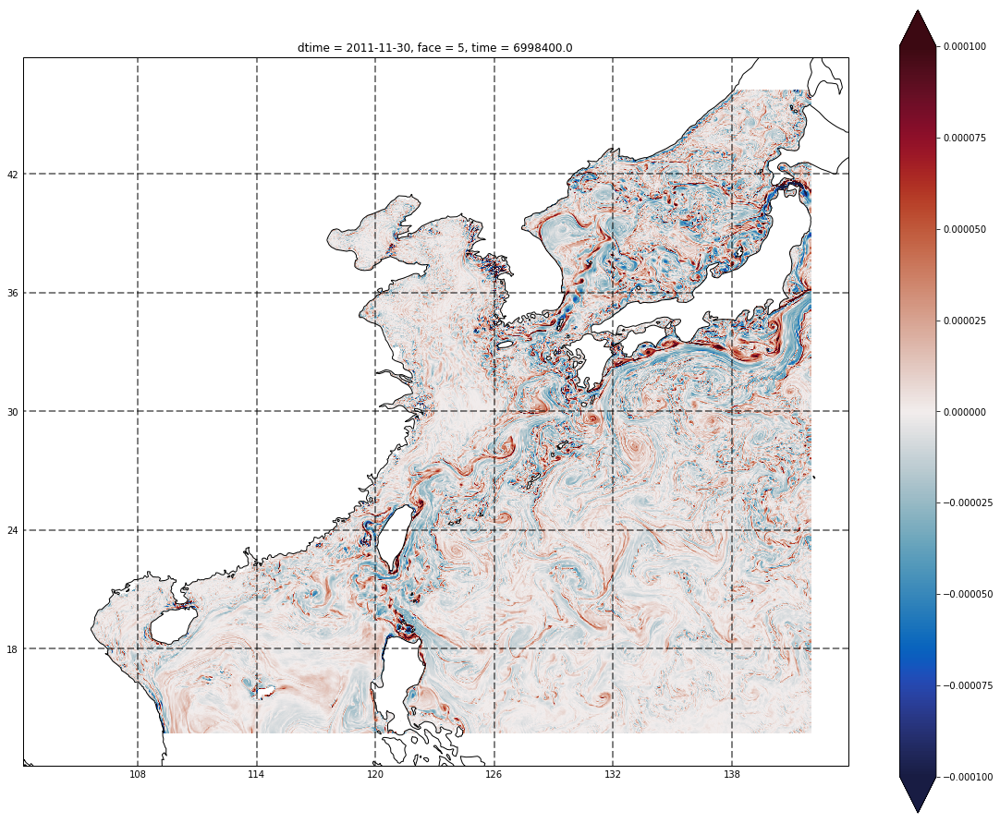

In [23]:
fig = plt.figure(figsize=(20,16))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
zeta.isel(i_g=slice(2500,4320), j_g=slice(0,2000)).plot.pcolormesh(ax=ax, x='XG', y='YG', transform=ccrs.PlateCarree(), vmin=-0.0001, vmax=0.0001, cmap = cm.balance)
gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
ax.coastlines(resolution='50m', color='k')

In [13]:
rossby_number = (zeta/f).load()

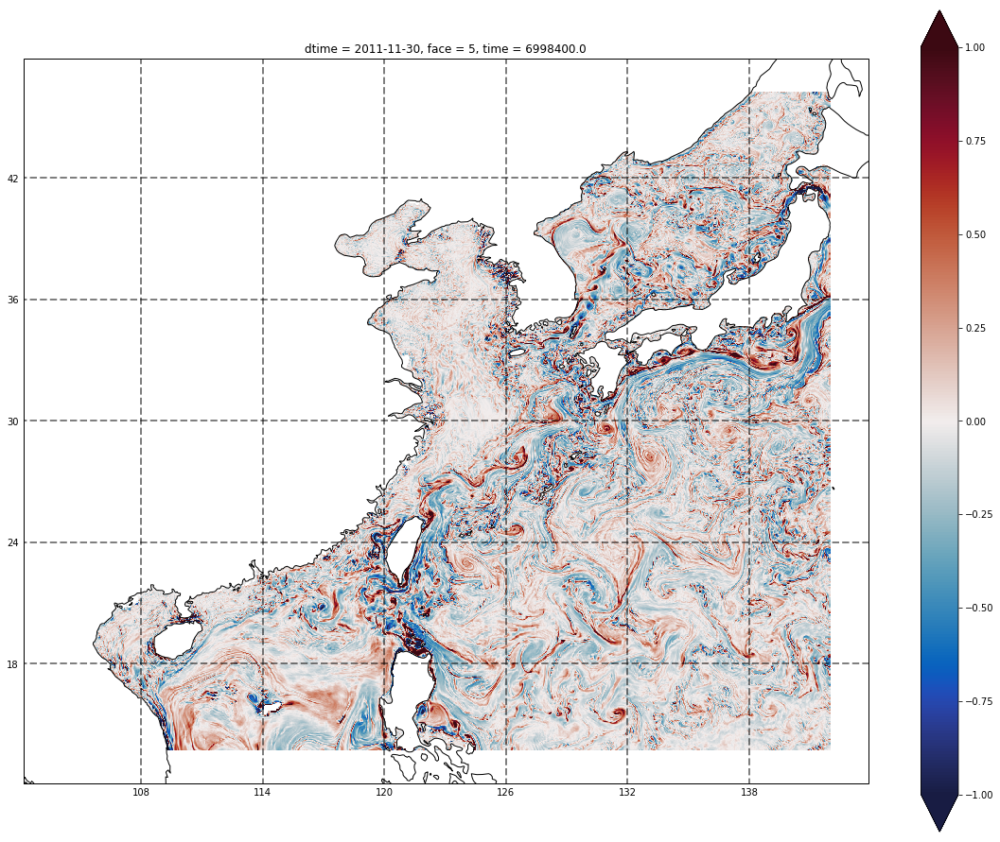

In [14]:
fig = plt.figure(figsize=(20,16))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
rossby_number.isel(i_g=slice(2500,4320), j_g=slice(0,2000)).plot.pcolormesh(ax=ax, x='XG', y='YG', transform=ccrs.PlateCarree(), vmin=-1., vmax=1., cmap = cm.balance)
gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
ax.coastlines(resolution='50m', color='k')

In [15]:
vel_div_components = grid.diff_2d_vector({'X': ds.dyG * ds['SSU_low'], 'Y': ds.dxG * ds['SSV_low']}, boundary='extend')
vel_div = (vel_div_components['X'] + vel_div_components['Y'])/ds.rA

In [17]:
lat_ij = ds['YC']
omega = 7.3/100000
f_ij = 2*omega*np.sin(np.deg2rad(lat_ij))

In [25]:
vel_div = vel_div.load()

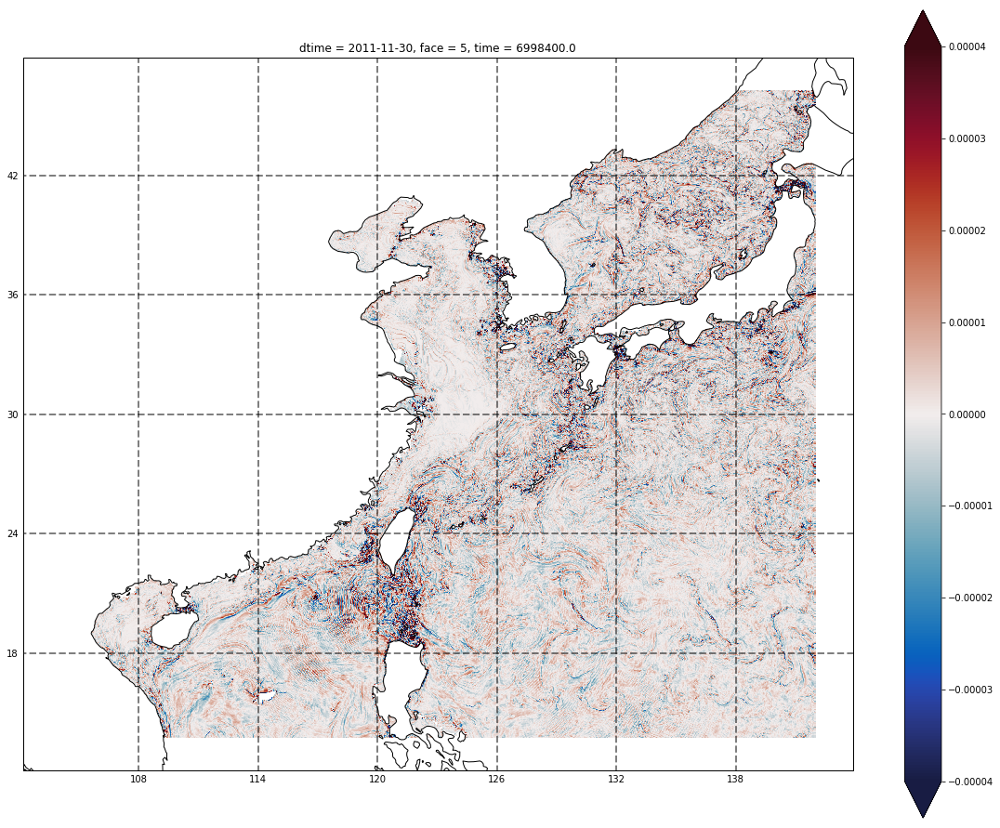

In [26]:
fig = plt.figure(figsize=(20,16))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
vel_div.isel(i=slice(2500,4320), j=slice(0,2000)).plot.pcolormesh(ax=ax, x='XC', y='YC', transform=ccrs.PlateCarree(), vmin=-0.00004, vmax=0.00004, cmap = cm.balance)
gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
ax.coastlines(resolution='50m', color='k')

In [18]:
vel_div_f = (vel_div/f_ij).load()

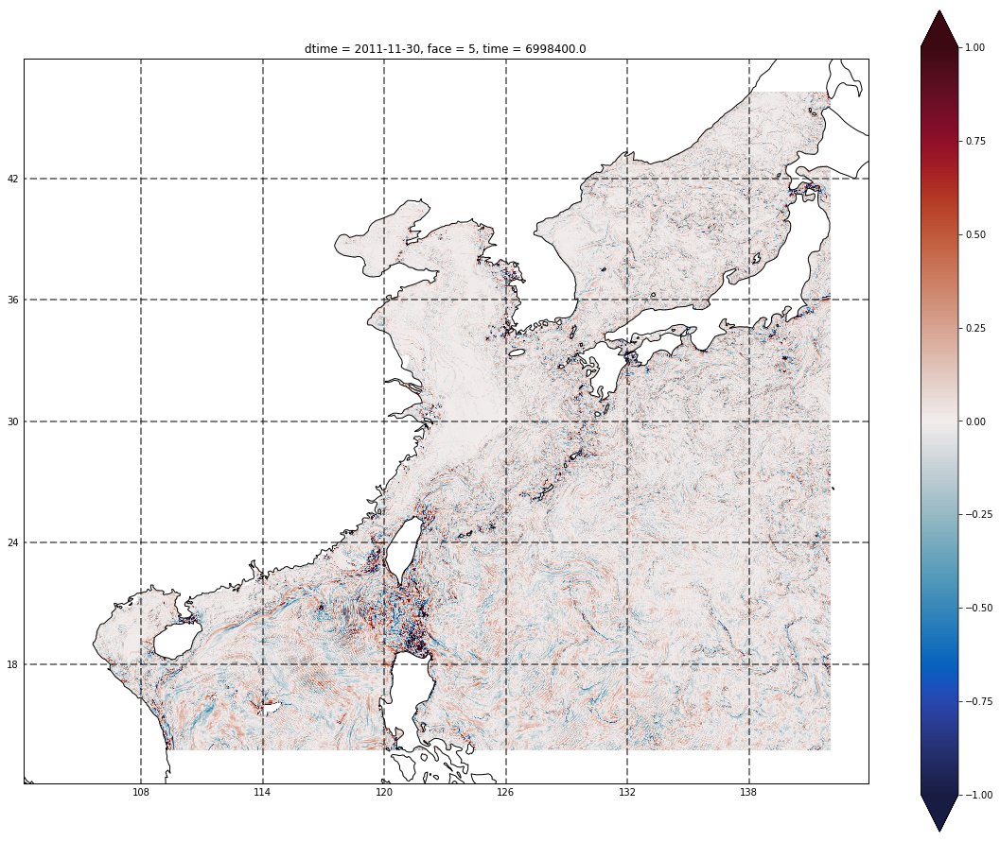

In [19]:
fig = plt.figure(figsize=(20,16))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
vel_div_f.isel(i=slice(2500,4320), j=slice(0,2000)).plot.pcolormesh(ax=ax, x='XC', y='YC', transform=ccrs.PlateCarree(), vmin=-1, vmax=1, cmap = cm.balance)
gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
ax.coastlines(resolution='50m', color='k')

## 3.2 raw

In [20]:
ds_SSU = xr.open_zarr(E_dir+'SSU.zarr')
ds_SSV = xr.open_zarr(E_dir+'SSV.zarr')

In [21]:
mgrid = xr.open_dataset(scratch+'/grid/mit_grid_t.nc')
grid = mgrid.isel(face=5)

In [22]:
ds = xr.merge([ds_SSU, ds_SSV, grid])
print(ds)

<xarray.Dataset>
Dimensions:  (i: 4320, i_g: 4320, j: 4320, j_g: 4320)
Coordinates:
    dtime    datetime64[ns] 2011-11-30
    face     int64 5
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
    time     float64 6.998e+06
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    XC       (i, j) float32 ...
    YC       (i, j) float32 ...
    XG       (i_g, j_g) float32 ...
    YG       (i_g, j_g) float32 ...
    CS       (i, j) float32 ...
    SN       (i, j) float32 ...
    rA       (i, j) float32 ...
    dxG      (i, j_g) float32 ...
    dyG      (j, i_g) float32 ...
    Depth    (i, j) float32 ...
    rAz      (i_g, j_g) float32 ...
    dxC      (j, i_g) float32 ...
    dyC      (i, j_g) float32 ...
    rAw      (j, i_g) float32 ...
    rAs      (i, j_g) float32 ...
Dat

In [23]:
grid = xgcm.Grid(ds, periodic=['X', 'Y'])
grid

<xgcm.Grid>
Y Axis (periodic):
  * center   j (4320) --> left
  * left     j_g (4320) --> center
X Axis (periodic):
  * center   i (4320) --> left
  * left     i_g (4320) --> center

In [24]:
zeta = (grid.diff(ds.dyC * ds['SSV'],'X') - grid.diff(ds.dxC * ds['SSU'],'Y'))/ds.rAz # relative vorticity  

In [32]:
zeta = zeta.load()

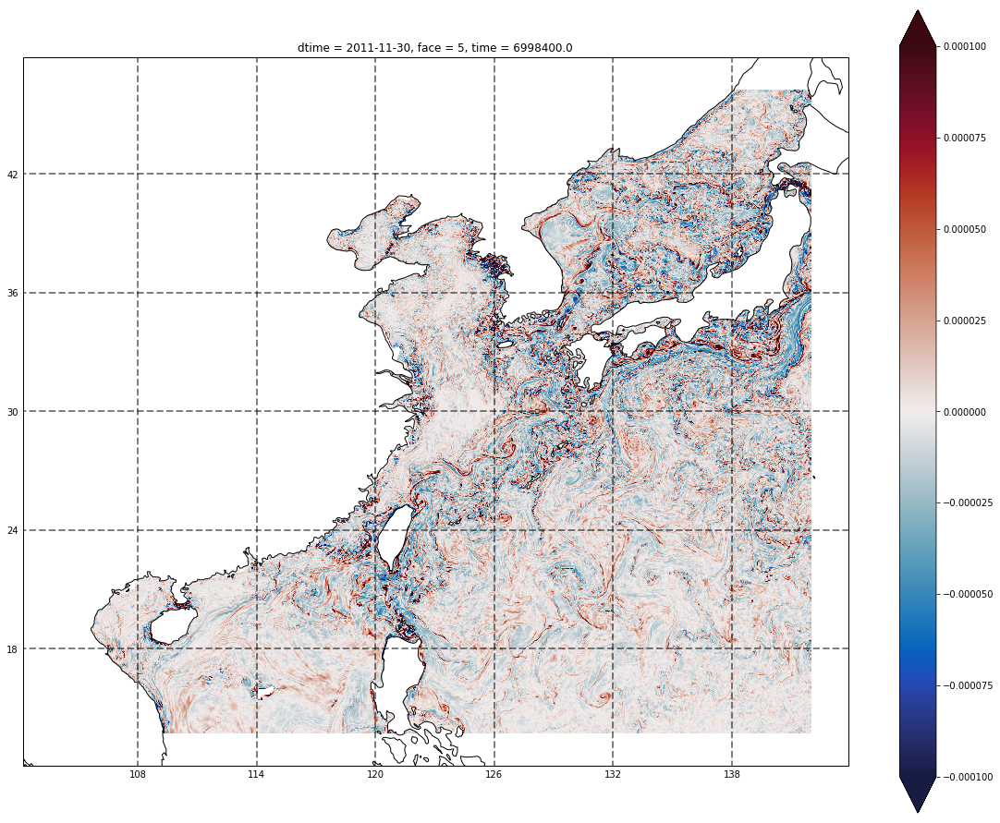

In [33]:
fig = plt.figure(figsize=(20,16))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
zeta.isel(i_g=slice(2500,4320), j_g=slice(0,2000)).plot.pcolormesh(ax=ax, x='XG', y='YG', transform=ccrs.PlateCarree(), vmin=-0.0001, vmax=0.0001, cmap = cm.balance)
gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
ax.coastlines(resolution='50m', color='k')

In [25]:
rossby_number = (zeta/f).load()

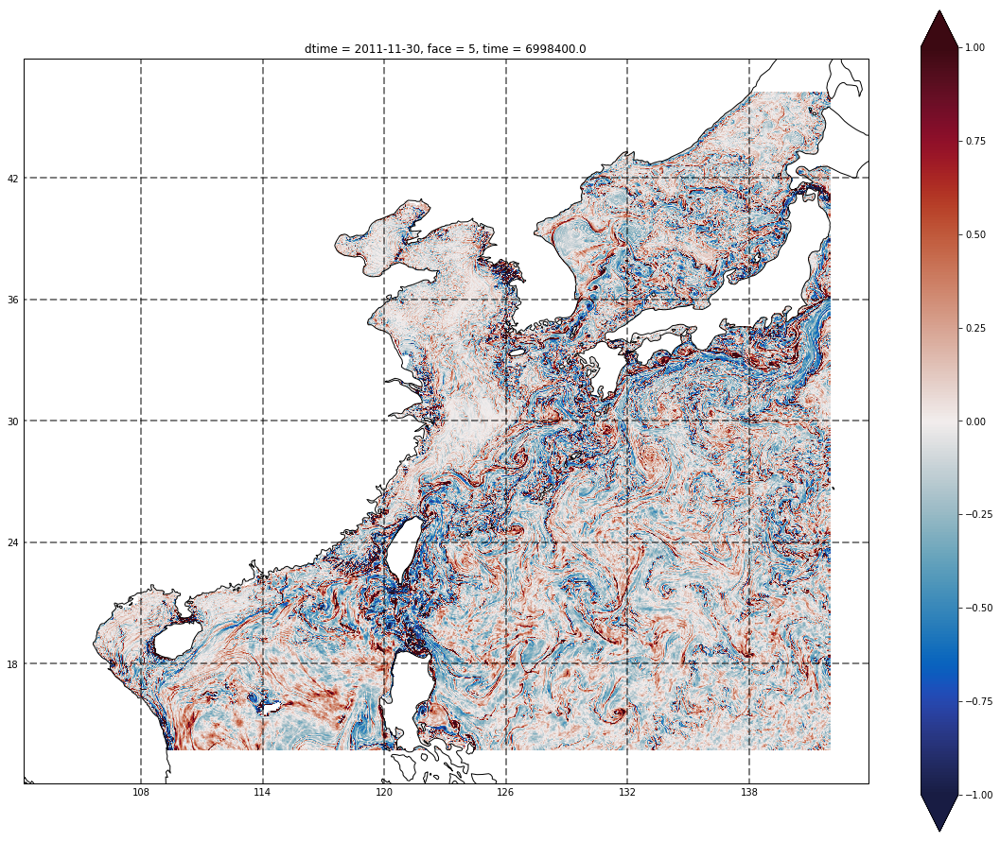

In [26]:
fig = plt.figure(figsize=(20,16))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
rossby_number.isel(i_g=slice(2500,4320), j_g=slice(0,2000)).plot.pcolormesh(ax=ax, x='XG', y='YG', transform=ccrs.PlateCarree(), vmin=-1., vmax=1., cmap = cm.balance)
gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
ax.coastlines(resolution='50m', color='k')

In [27]:
vel_div_components = grid.diff_2d_vector({'X': ds.dyG * ds['SSU'], 'Y': ds.dxG * ds['SSV']}, boundary='extend')
vel_div = (vel_div_components['X'] + vel_div_components['Y'])/ds.rA

In [28]:
vel_div = vel_div.load()

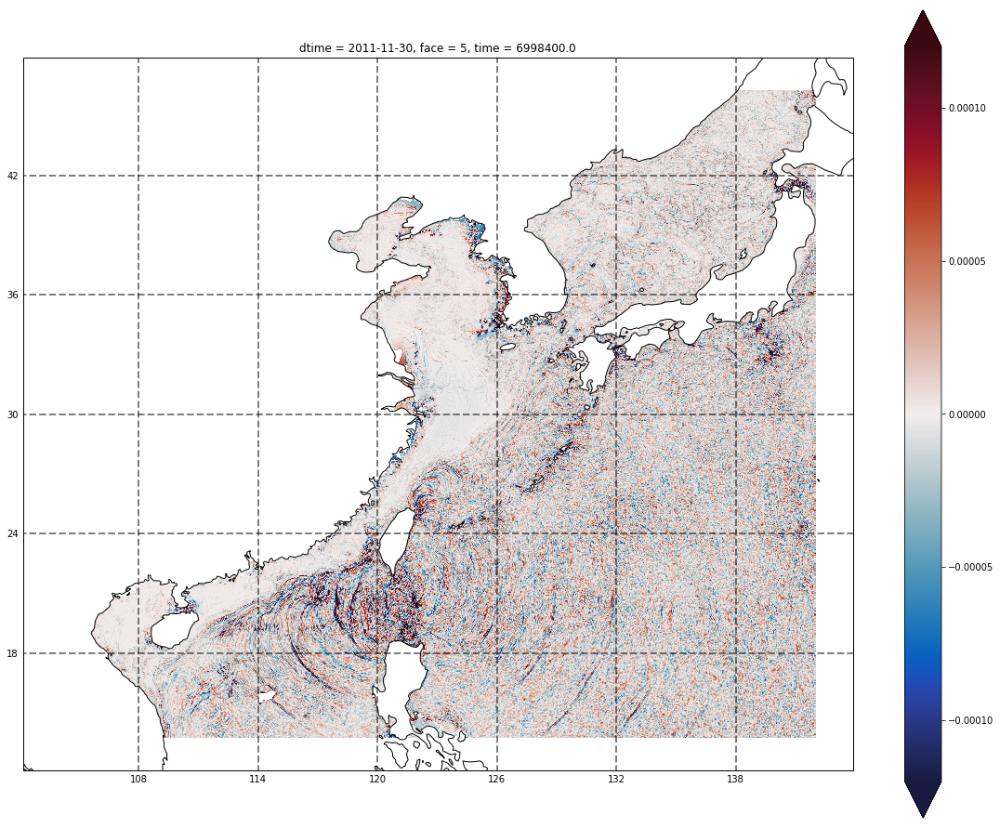

In [38]:
fig = plt.figure(figsize=(20,16))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
vel_div.isel(i=slice(2500,4320), j=slice(0,2000)).plot.pcolormesh(ax=ax, x='XC', y='YC', transform=ccrs.PlateCarree(), vmin=-0.00012, vmax=0.00012, cmap = cm.balance)
gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
ax.coastlines(resolution='50m', color='k')

In [29]:
vel_div_f = (vel_div/f_ij).load()

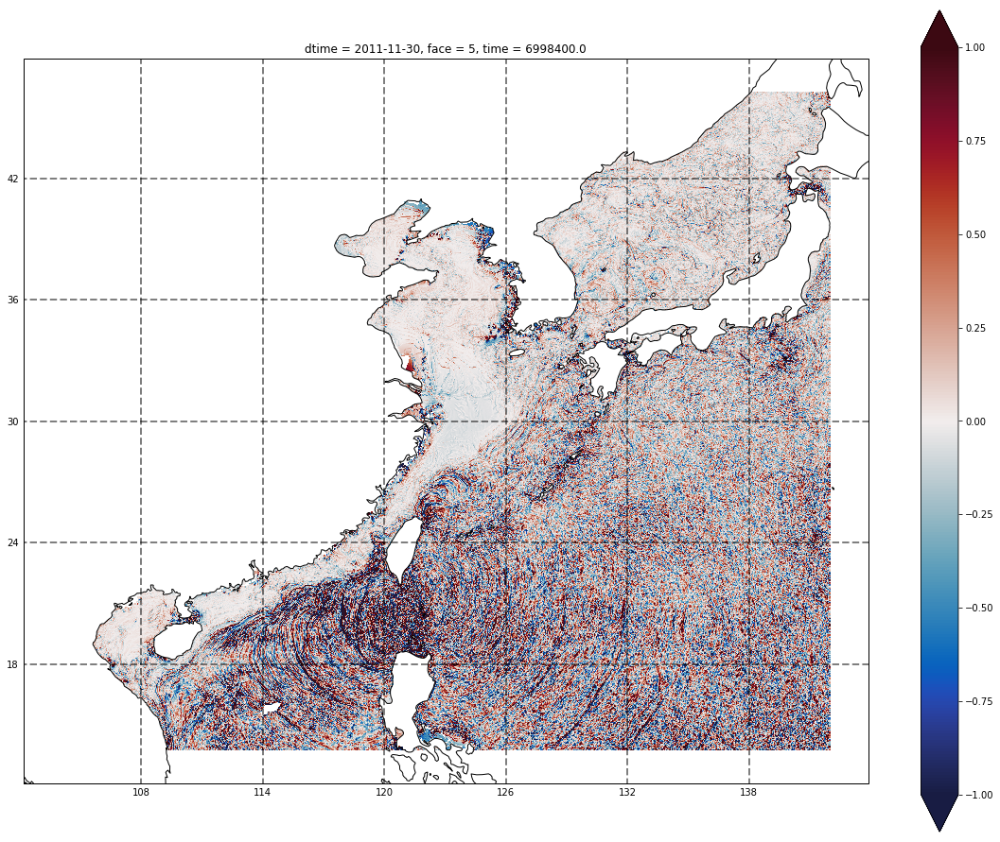

In [30]:
fig = plt.figure(figsize=(20,16))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
vel_div_f.isel(i=slice(2500,4320), j=slice(0,2000)).plot.pcolormesh(ax=ax, x='XC', y='YC', transform=ccrs.PlateCarree(), vmin=-1, vmax=1, cmap = cm.balance)
gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
ax.coastlines(resolution='50m', color='k')

In [32]:
cluster.scheduler.close()

<Future finished result=None>